Exercise work consists of three parts. After each part, take the mini-exam available in Moodle. The questions concern the exercise so read the instructions carefully and make sure you remember to cover all given tasks. <br>
After the deadline of each mini-exam, example results will be published. This helps you to move to the next part. However, take into account that the deadlines are thus strict, no extensions will be granted! <br>
Two exam points can be acquired from each mini-exam. All three parts of the exercise are compulsory. Completed exercise work from previous years does not apply for this course.

**Deadlines for the mini-exams:**
- Part 1: Fri 9.2.2024 at 23:59
- Part 2: Fri 23.2024 at 23:59
- Part 3: Fri 8.3.2024 at 23:59

**If you encounter problems, Google first and if you can’t find an answer, ask for help**
- Moodle area for questions
- pekavir@utu.fi

**Grading**

The exercise covers a part of the grading in this course. The course exam has 5 questions, 6 points of each. Exercise gives at maximum 6 points, i.e. the total score is 36 points.

# Part 1

# Part 2

Import all the packages needed for this notebook in one cell (add the ones you apply):

In [24]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

## Data exploration

Import the training data set prepared in the previous part of the exercise.

In [2]:
df = pd.read_parquet('../training_data/rice_df.parquet')

# separate numeric and non-numeric columns
numeric_columns = df.select_dtypes(include=['number']).columns
non_numeric_columns = df.select_dtypes(exclude=['number']).columns

Standardize the data using Z-score.

In [3]:
# create scaler
scaler = StandardScaler()

# standardize numeric columns
df[numeric_columns] = scaler.fit_transform(df[numeric_columns])

# show first five rows
df.head()

,species,Y_color_means,Y_color_vars,Y_color_skews,Y_color_kurts,Cb_color_means,Cb_color_vars,Cb_color_skews,Cb_color_kurts,Cr_color_means,...,Cr_color_skews,Cr_color_kurts,major_axis,minor_axis,contour_area,perimeter,equivalent_diameter,compactness,sf1,sf2
0,Arborio,-0.189539,0.663085,-0.484918,-0.723800,-0.507211,-0.571090,2.101901,0.566656,0.426438,...,-0.227938,-0.180458,-0.665352,0.321248,-0.182390,-0.448377,-0.113360,0.654257,-0.547228,0.461517
1,Arborio,-1.171772,-0.667290,1.650517,0.118346,-0.619518,-0.718146,1.934162,0.654468,0.346582,...,0.025026,-0.162598,-1.082999,-0.450514,-0.861651,-1.162162,-0.928327,0.447067,0.092735,1.046683
2,Arborio,-0.462261,2.693689,0.083048,-0.823756,-0.686230,-0.681997,1.590945,-0.161128,0.758610,...,-0.107336,-0.174423,-0.533534,0.019479,-0.262677,-0.394093,-0.203455,0.352831,-0.334884,0.262749
3,Arborio,-1.360755,0.880026,-0.701611,-0.787518,-0.482629,-0.647043,1.468330,-0.491845,0.323858,...,0.182732,-0.141487,-0.530010,0.191913,-0.131040,-0.393507,-0.056483,0.498622,-0.497611,0.217360
4,Arborio,0.426760,1.291375,-1.166186,-0.274361,-0.764559,-0.562258,1.600571,-0.267993,0.765911,...,-0.129477,-0.175875,-0.465041,-0.143466,-0.360192,-0.393507,-0.314887,0.139003,-0.139223,0.255920


### Histograms

Plot a histogram for each Z-scored feature. Plot all rice species in the same figure and use different color for each.

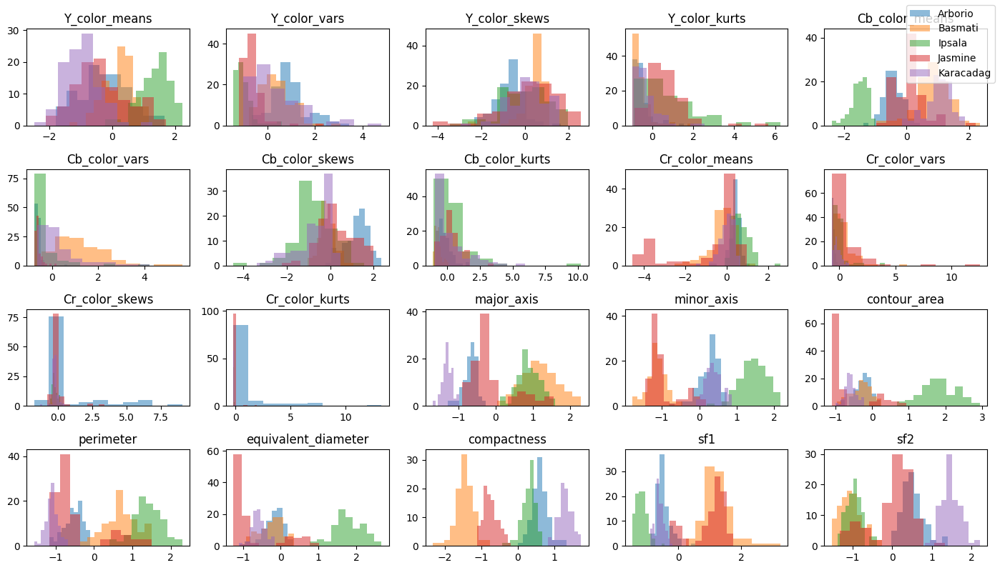

In [14]:
# group df to plot each species in the same plot
grouped_df = df.groupby('species')

# create figure
fig, axes = plt.subplots(4, 5, figsize=(14, 8))

# flatten axes indexes for easy iteration
axes = axes.flatten()

# loop through axes and columns
for i, column in enumerate(numeric_columns):
    ax = axes[i]
    # plot each group in the same plot
    for group, group_df in grouped_df:
        ax.hist(group_df[column], bins=10, alpha=0.5, label=str(group))
    ax.set_title(column)

# add legend
fig.legend(df['species'].unique())

# Adjust layout
plt.tight_layout()
plt.show()

Which features may have some discriminative power over rice species according to the histograms?

<i><small>Some of the features clearly divide the species. Especially compactness divides the rice species very discriminatively. Only Arborio and Ipsala overlap slightly. Overall, from the dimensional features we can distinguish different rice species quite well, at least much better than from the color features. This is expected as there are much larger differences in the sizes and dimensions of the rice than there are in the colors.

For example, if we have the compactness and the contour area of the rice, we can quite confidently identify the rice. Even with only compactness the accuracy would be pretty good.</small></i>

### Pairplot

Plot pairplots, each Z-scored feature against each Z-scored feature. Are there any correlating features according to the pairplot?

c:\Python310\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


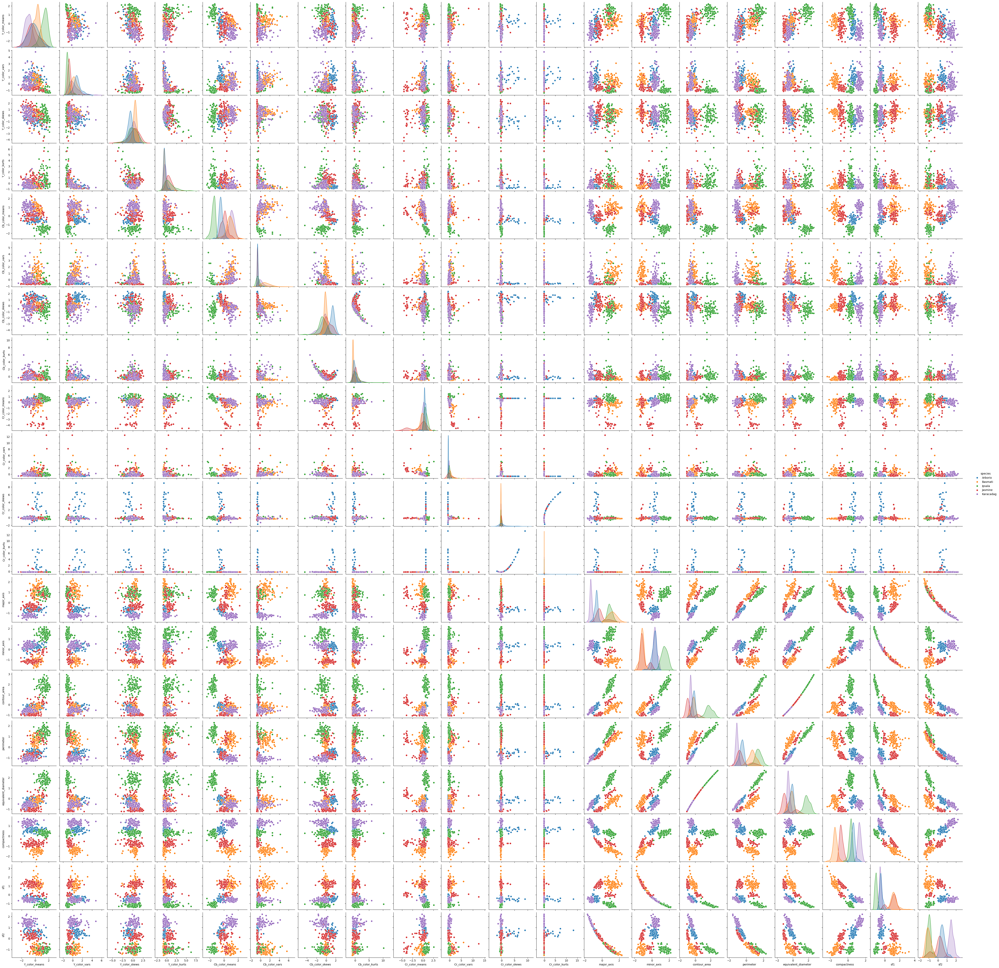

In [15]:
sns.pairplot(df, hue='species')

<i><small>Obviously some of the features are correlated since they are calculated from one-another. For example the features 'contour area' and 'equivalent diameter' are correlated because 'equivalent diameter' is calculated directly from the 'contour area'. Ignoring the features that are extracted from other features, we can see that the dimensional features are still quite well correlated. This also makes very much sense. 'Contour area' and 'perimeter' are correlated to each other and both minor and major axis. 

I find it odd how the skewness and kurtosis of the Cr-component only varies in the Arborio instances. </small></i>

### PCA

Fit PCA using two principal components (remember to use Z-scored feature values). <br>
Plot the PCA figure with two components, and color the data points according to their species. <br>
Show the legend and label the axes.
Save the figure as a png-file.

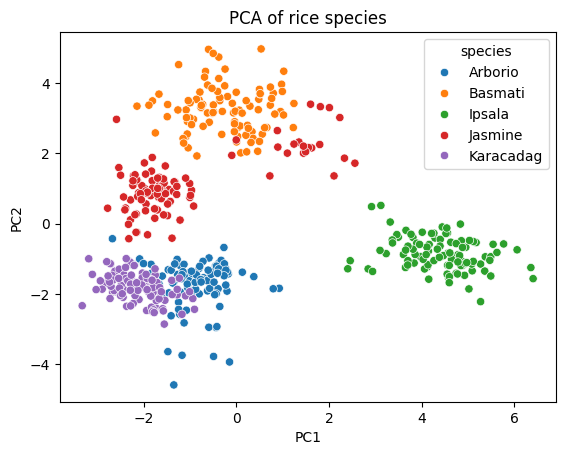

In [23]:
# pca transform and add components to data frame
pca = PCA(n_components=2)
pca_df = pca.fit(df[numeric_columns])
pca_df = pd.DataFrame(pca.transform(df[numeric_columns]), columns=['PC1', 'PC2'])

pca_df = pd.concat([df, pca_df], axis=1)

# plot the components
sns.scatterplot(x='PC1', y='PC2', hue='species', data=pca_df)
plt.title('PCA of rice species')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()

Can you see any clusters in the PCA figure? Does this figure give you any clues, how well you will be able to classify the rice species? Explain.

<i><small>There are clear clusters in the PCA figure. For example the 'Ipsala' species are completely in a distinguishable cluster. 'Arborio' and 'Karacadag' form another cluster with a clear division within it. Most of 'Jasmine' is in its own compact cluster but some of the instances are in the less compact 'Basmati' cluster.

The PCA tries to include the most variance of the original features as possible into fewer features. This plot gives a clear objection that there is clear variance between the species and that the species are classifiable, some more easily than others. 'Ipsala' is easier to classify than an 'Arbario' that's close to 'Karacadag'. </small></i>

How many PCA components are needed to cover 97% of the variance?

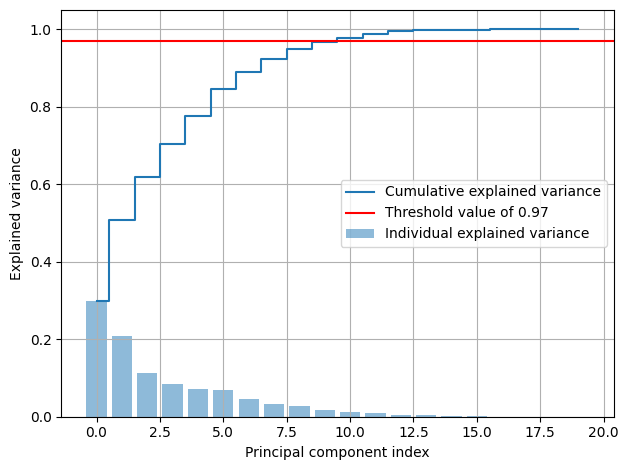

In [33]:
# create new pca with more components
pca = PCA()
pca_df = pca.fit_transform(df[numeric_columns])

# determine explained variance
exp_var_pca = pca.explained_variance_ratio_

# cumulative sum of eigenvalues
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

# create plot
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, where='mid',label='Cumulative explained variance')
plt.axhline(y = 0.97, color = 'r', linestyle = '-', label='Threshold value of 0.97')
plt.grid()
plt.ylabel('Explained variance')
plt.xlabel('Principal component index')
plt.legend(loc='center right')
plt.tight_layout()
plt.show()

<i><small>From the plot we can see that the cumulative explained variance surpasses the threshold value at the PC indexed 10, which is the 11th PC.

<b>We need 11 principle components to explain 97% of the variance.</b></small></i>

## Model selection

Select the best model for each classifier. Use 5-fold repeated cross validation with 3 repetitions (*RepeatedKFold* from sklearn). Use the following hyperparameters:

- Random Forest
    - n_estimators from 100 to 300 with 50 steps
    - max_features = ['sqrt', 'log2', None]
    - whether to use bootstrap or not 

- Support Vector Machine
    - gamma = ['scale', 'auto']
    - C = [0.1, 1, 10, 100]
    - kernel = ['linear', 'rbf', 'poly']
    
- MLP:
    - use one hidden layer
    - number of neurons in the hidden layer from 15 to 40 in 5 neuron steps
    - activation function: hyperbolic tanh function and rectified linear unit function
    - solver: stochastic gradient descent and adam
    - validation_fraction: 0.1 and 0.3
    - strength of the L2 regularization term: alpha = [0.01, 0.1, 1]

For each classifier:
- Report the selected combination of hyperparameters <br>
- Report the accuracy value for each hyperparameter combination <br>

For Random Forest model, report the feature importance for each feature. Which features seem to be the most important? Does this correspond with the observations you made in the data exploration? <br>
Ponder the model selection process. Which things should be considered? How could you improve the model selection process?

Which model seems to benefit the most of the hyperparameter tuning (with these parameter combinations)?